# Import defualt neccessary package

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

# Feature selection

In [2]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [3]:
# preprocessing
model_file_name = 'model.joblib'
left_foot = pd.read_csv('../data/left_foot_data.csv')
right_foot = pd.read_csv('../data/left_foot_data.csv')
left_foot = left_foot.drop(['order'], axis=1) 
right_foot = right_foot.drop(['order'], axis=1) 
feet = [left_foot, right_foot]
data = pd.concat(feet).reset_index()
data

,index,foot_type,heel_to_fore,heel_to_distal_metatrasal,middle_foot_width,heel_to_apex1,heel_to_apex5,apex1_to_apex5,heel_width,heel_to_middle,arch_height,area_a,area_b,area_c
0,0,Normal,23.700,20.491,8.038,16.799,14.899,9.661,5.149,10.246,2.95,36,21,33
1,1,Normal,25.805,21.077,8.417,18.155,16.506,10.358,6.057,10.589,3.61,46,25,34
2,2,High,22.315,19.182,7.381,16.145,14.155,9.515,5.680,9.591,3.54,27,12,34
3,3,Normal,23.366,19.556,7.191,17.045,14.642,8.949,5.698,9.778,3.52,36,20,34
4,4,High,21.323,18.338,6.821,15.635,14.316,8.507,5.337,9.169,3.39,28,3,27
5,5,Flat,23.786,20.606,7.946,17.446,15.679,9.785,5.408,10.303,3.34,37,25,27
6,6,Flat,22.652,19.242,7.362,16.919,14.624,8.516,4.966,9.621,3.03,32,23,32
7,7,Flat,23.058,18.924,7.528,16.397,14.595,8.955,5.037,9.462,2.70,32,28,33
8,8,High,24.949,21.021,8.581,18.168,15.908,10.000,5.874,10.511,3.48,38,10,32
9,9,High,22.089,18.893,7.515,16.247,14.124,9.978,5.106,9.447,3.47,41,31,45


In [4]:
# Encode label type
clean_up = {'foot_type':{'Normal': 0, 'Flat': 1, 'High': 2}}
encoded_data = data.replace(clean_up)
encoded_data

,index,foot_type,heel_to_fore,heel_to_distal_metatrasal,middle_foot_width,heel_to_apex1,heel_to_apex5,apex1_to_apex5,heel_width,heel_to_middle,arch_height,area_a,area_b,area_c
0,0,0,23.700,20.491,8.038,16.799,14.899,9.661,5.149,10.246,2.95,36,21,33
1,1,0,25.805,21.077,8.417,18.155,16.506,10.358,6.057,10.589,3.61,46,25,34
2,2,2,22.315,19.182,7.381,16.145,14.155,9.515,5.680,9.591,3.54,27,12,34
3,3,0,23.366,19.556,7.191,17.045,14.642,8.949,5.698,9.778,3.52,36,20,34
4,4,2,21.323,18.338,6.821,15.635,14.316,8.507,5.337,9.169,3.39,28,3,27
5,5,1,23.786,20.606,7.946,17.446,15.679,9.785,5.408,10.303,3.34,37,25,27
6,6,1,22.652,19.242,7.362,16.919,14.624,8.516,4.966,9.621,3.03,32,23,32
7,7,1,23.058,18.924,7.528,16.397,14.595,8.955,5.037,9.462,2.70,32,28,33
8,8,2,24.949,21.021,8.581,18.168,15.908,10.000,5.874,10.511,3.48,38,10,32
9,9,2,22.089,18.893,7.515,16.247,14.124,9.978,5.106,9.447,3.47,41,31,45


# Calculate SI and CSI

In [5]:
# Calculate SI & CSI
encoded_data['SI'] = data['middle_foot_width']/data['heel_width']
encoded_data['CSI'] = data['middle_foot_width']/data['apex1_to_apex5']
encoded_data

,index,foot_type,heel_to_fore,heel_to_distal_metatrasal,middle_foot_width,heel_to_apex1,heel_to_apex5,apex1_to_apex5,heel_width,heel_to_middle,arch_height,area_a,area_b,area_c,SI,CSI
0,0,0,23.700,20.491,8.038,16.799,14.899,9.661,5.149,10.246,2.95,36,21,33,1.561080,0.832005
1,1,0,25.805,21.077,8.417,18.155,16.506,10.358,6.057,10.589,3.61,46,25,34,1.389632,0.812609
2,2,2,22.315,19.182,7.381,16.145,14.155,9.515,5.680,9.591,3.54,27,12,34,1.299472,0.775723
3,3,0,23.366,19.556,7.191,17.045,14.642,8.949,5.698,9.778,3.52,36,20,34,1.262022,0.803553
4,4,2,21.323,18.338,6.821,15.635,14.316,8.507,5.337,9.169,3.39,28,3,27,1.278059,0.801810
5,5,1,23.786,20.606,7.946,17.446,15.679,9.785,5.408,10.303,3.34,37,25,27,1.469305,0.812059
6,6,1,22.652,19.242,7.362,16.919,14.624,8.516,4.966,9.621,3.03,32,23,32,1.482481,0.864490
7,7,1,23.058,18.924,7.528,16.397,14.595,8.955,5.037,9.462,2.70,32,28,33,1.494540,0.840648
8,8,2,24.949,21.021,8.581,18.168,15.908,10.000,5.874,10.511,3.48,38,10,32,1.460844,0.858100
9,9,2,22.089,18.893,7.515,16.247,14.124,9.978,5.106,9.447,3.47,41,31,45,1.471798,0.753157


# Calculate MAI and AI

In [6]:
encoded_data['AI'] = data['area_b']/(data['area_a']+data['area_b']+data['area_c'])
encoded_data['MAI'] = data['area_a']/(data['area_a']+data['area_b']+data['area_c'])
encoded_data

,index,foot_type,heel_to_fore,heel_to_distal_metatrasal,middle_foot_width,heel_to_apex1,heel_to_apex5,apex1_to_apex5,heel_width,heel_to_middle,arch_height,area_a,area_b,area_c,SI,CSI,AI,MAI
0,0,0,23.700,20.491,8.038,16.799,14.899,9.661,5.149,10.246,2.95,36,21,33,1.561080,0.832005,0.233333,0.400000
1,1,0,25.805,21.077,8.417,18.155,16.506,10.358,6.057,10.589,3.61,46,25,34,1.389632,0.812609,0.238095,0.438095
2,2,2,22.315,19.182,7.381,16.145,14.155,9.515,5.680,9.591,3.54,27,12,34,1.299472,0.775723,0.164384,0.369863
3,3,0,23.366,19.556,7.191,17.045,14.642,8.949,5.698,9.778,3.52,36,20,34,1.262022,0.803553,0.222222,0.400000
4,4,2,21.323,18.338,6.821,15.635,14.316,8.507,5.337,9.169,3.39,28,3,27,1.278059,0.801810,0.051724,0.482759
5,5,1,23.786,20.606,7.946,17.446,15.679,9.785,5.408,10.303,3.34,37,25,27,1.469305,0.812059,0.280899,0.415730
6,6,1,22.652,19.242,7.362,16.919,14.624,8.516,4.966,9.621,3.03,32,23,32,1.482481,0.864490,0.264368,0.367816
7,7,1,23.058,18.924,7.528,16.397,14.595,8.955,5.037,9.462,2.70,32,28,33,1.494540,0.840648,0.301075,0.344086
8,8,2,24.949,21.021,8.581,18.168,15.908,10.000,5.874,10.511,3.48,38,10,32,1.460844,0.858100,0.125000,0.475000
9,9,2,22.089,18.893,7.515,16.247,14.124,9.978,5.106,9.447,3.47,41,31,45,1.471798,0.753157,0.264957,0.350427


In [7]:
first_col = encoded_data.pop('arch_height')
encoded_data.insert(17, 'arch_height', first_col)

In [8]:
encoded_data

,index,foot_type,heel_to_fore,heel_to_distal_metatrasal,middle_foot_width,heel_to_apex1,heel_to_apex5,apex1_to_apex5,heel_width,heel_to_middle,area_a,area_b,area_c,SI,CSI,AI,MAI,arch_height
0,0,0,23.700,20.491,8.038,16.799,14.899,9.661,5.149,10.246,36,21,33,1.561080,0.832005,0.233333,0.400000,2.95
1,1,0,25.805,21.077,8.417,18.155,16.506,10.358,6.057,10.589,46,25,34,1.389632,0.812609,0.238095,0.438095,3.61
2,2,2,22.315,19.182,7.381,16.145,14.155,9.515,5.680,9.591,27,12,34,1.299472,0.775723,0.164384,0.369863,3.54
3,3,0,23.366,19.556,7.191,17.045,14.642,8.949,5.698,9.778,36,20,34,1.262022,0.803553,0.222222,0.400000,3.52
4,4,2,21.323,18.338,6.821,15.635,14.316,8.507,5.337,9.169,28,3,27,1.278059,0.801810,0.051724,0.482759,3.39
5,5,1,23.786,20.606,7.946,17.446,15.679,9.785,5.408,10.303,37,25,27,1.469305,0.812059,0.280899,0.415730,3.34
6,6,1,22.652,19.242,7.362,16.919,14.624,8.516,4.966,9.621,32,23,32,1.482481,0.864490,0.264368,0.367816,3.03
7,7,1,23.058,18.924,7.528,16.397,14.595,8.955,5.037,9.462,32,28,33,1.494540,0.840648,0.301075,0.344086,2.70
8,8,2,24.949,21.021,8.581,18.168,15.908,10.000,5.874,10.511,38,10,32,1.460844,0.858100,0.125000,0.475000,3.48
9,9,2,22.089,18.893,7.515,16.247,14.124,9.978,5.106,9.447,41,31,45,1.471798,0.753157,0.264957,0.350427,3.47


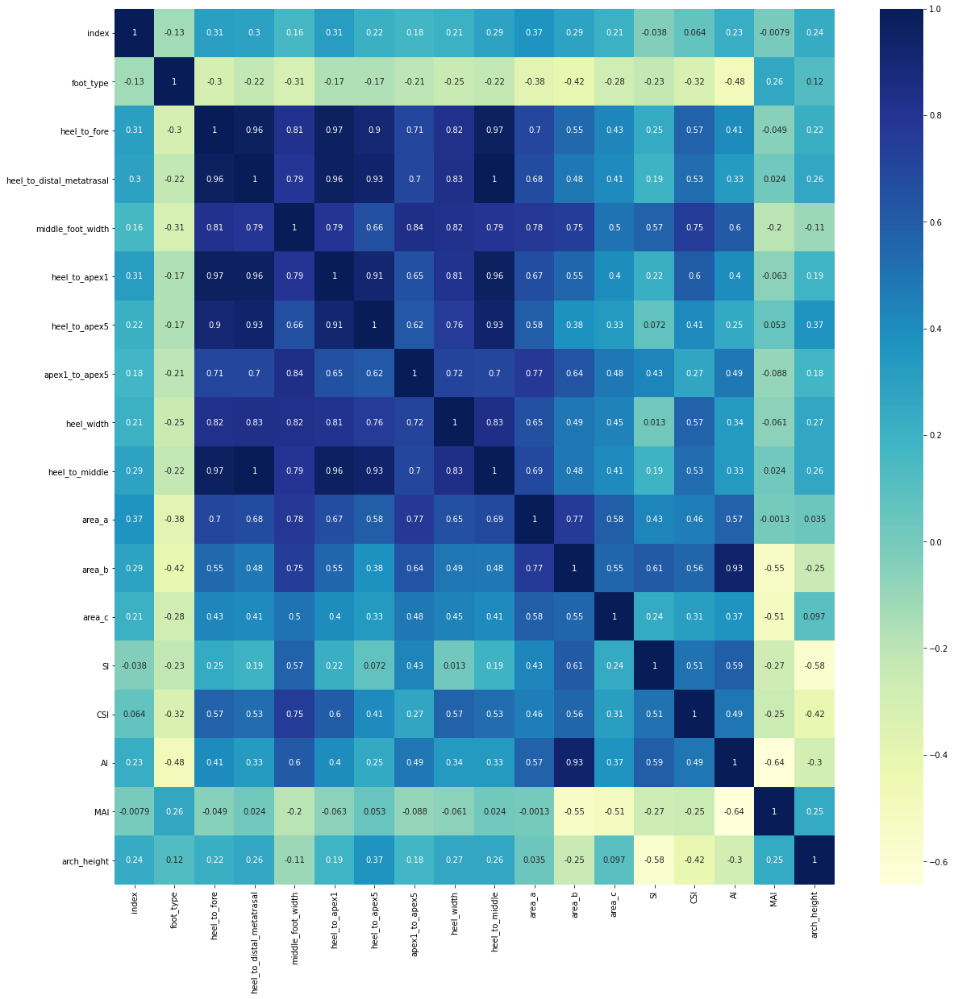

In [9]:
corrmat = encoded_data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(encoded_data[top_corr_features].corr(),annot=True, cmap="YlGnBu")

In [10]:
# Select only features that have correlation with arch height more tham 0.26  , 'heel_to_distal_metatrasal', 'AI', 'heel_to_middle'
selected_feature = ['heel_to_apex5', 'heel_width', 'SI', 'CSI']
features = encoded_data[selected_feature]
target = encoded_data[['arch_height']]

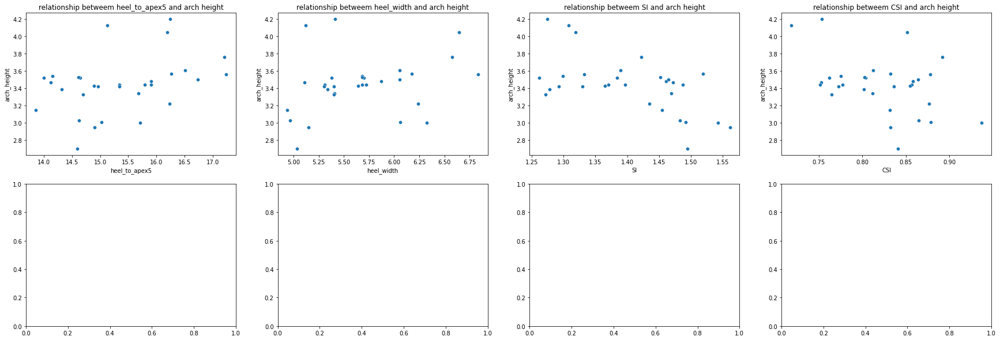

In [11]:
# Check data trend
fig, axes = plt.subplots(ncols=4, nrows=2, figsize=(30, 10))
column = 0
row = 0
for feature in selected_feature:
    sns.scatterplot(data=encoded_data, x=feature, y="arch_height", ax=axes[row][column])
    axes[row][column].set_title((
    f'relationship betweem {feature} and arch height'
    ))
    column += 1
    if(column == 4):
        row = 1
        column = 0
# sns.scatterplot(data=tips, x="total_bill", y="tip")

### Summary
All relationships is almost linear relationship, so we should not use polynomial regression on this dataset.

# Model selection
- linear regression
- Polynomial regression
- Decision tree regression
- Elasticnet regression
- NeuralNetwork Regression
- Lasso regression
- Ridge regression
- SVM

In [12]:
# Split train and test
from sklearn.model_selection import train_test_split

In [13]:
from sklearn.model_selection import cross_validate, LeaveOneOut
from sklearn.pipeline import Pipeline
from sklearn import preprocessing
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

## Linear regression

In [14]:
all_train_scores = pd.DataFrame(columns=['train_neg_mean_squared_error', 'train_neg_mean_absolute_error',  'train_r2', 'train_neg_mean_absolute_percentage_error', 'model'])
all_test_scores = pd.DataFrame(columns=['test_neg_mean_squared_error', 'test_neg_mean_absolute_error',  'test_r2', 'test_neg_mean_absolute_percentage_error', 'model'])
all_avg_train_scores = pd.DataFrame(columns=['train_neg_mean_squared_error', 'train_neg_mean_absolute_error',  'train_r2', 'train_neg_mean_absolute_percentage_error', 'model'])
all_avg_test_scores = pd.DataFrame(columns=['test_neg_mean_squared_error', 'test_neg_mean_absolute_error',  'test_r2', 'test_neg_mean_absolute_percentage_error', 'model'])
sample_test_score = pd.DataFrame(columns=['MAE', 'MSE',  'R2', 'MAPEE', 'model'])

In [15]:
def cross_val(model, model_name, features_train, features_test, target_train, target_test, loo = False):
    cv = 10
    if(loo):
        cv = LeaveOneOut()
    scores = cross_validate(
    model, features_train, target_train, cv=cv, 
    scoring=['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2',  'neg_mean_absolute_percentage_error'],
    return_train_score=True)
    a = pd.DataFrame(scores)
    a['fold'] = a.index
    a = a.drop(columns=['fit_time', 'score_time'])
    a['test_neg_mean_squared_error'] = a['test_neg_mean_squared_error'] * -1
    a['train_neg_mean_squared_error'] = a['train_neg_mean_squared_error'] * -1
    a['test_neg_mean_absolute_error'] = a['test_neg_mean_absolute_error'] * -1
    a['train_neg_mean_absolute_error'] = a['train_neg_mean_absolute_error'] * -1
    a['test_r2'] = a['test_r2'] * -1
    a['train_r2'] = a['train_r2'] * -1
    a['test_neg_mean_absolute_percentage_error'] = a['test_neg_mean_absolute_percentage_error'] * -1
    a['train_neg_mean_absolute_percentage_error'] = a['train_neg_mean_absolute_percentage_error'] * -1
    b = pd.melt(a, id_vars='fold', var_name='split', value_name='score')
    fig, axes = plt.subplots(ncols=4, figsize=(30, 4))
    sns.barplot(
        x='fold', y='score', hue='split',
        hue_order=['train_neg_mean_squared_error', 'test_neg_mean_squared_error'], data=b, ax=axes[0])
    axes[0].set_title((
        f'{model_name}\n'
        f'Train avg MSE = {a["train_neg_mean_squared_error"].mean():.3} +/- {a["train_neg_mean_squared_error"].std() * 2:.3}\n'
        f'Test avg MSE = {a["test_neg_mean_squared_error"].mean():.3} +/- {a["test_neg_mean_squared_error"].std() * 2:.3}'
        ))

    sns.barplot(
        x='fold', y='score', hue='split',
        hue_order=['train_neg_mean_absolute_error', 'test_neg_mean_absolute_error'], data=b, ax=axes[1])
    axes[1].set_title((
        f'{model_name}\n'
        f'Train avg MAE = {a["train_neg_mean_absolute_error"].mean():.3} +/- {a["train_neg_mean_absolute_error"].std() * 2:.3}\n'
        f'Test avg MAE = {a["test_neg_mean_absolute_error"].mean():.3} +/- {a["test_neg_mean_absolute_error"].std() * 2:.3}'
        ))

    sns.barplot(
        x='fold', y='score', hue='split',
        hue_order=['train_r2', 'test_r2'], data=b, ax=axes[2])
    axes[2].set_title((
        f'{model_name}\n'
        f'Train avg r2 = {a["train_r2"].mean():.3} +/- {a["train_r2"].std() * 2:.3}\n'
        f'Test avg r2 = {a["test_r2"].mean():.3} +/- {a["test_r2"].std() * 2:.3}'
        ))

    sns.barplot(
        x='fold', y='score', hue='split',
        hue_order=['train_neg_mean_absolute_percentage_error', 'test_neg_mean_absolute_percentage_error'], data=b, ax=axes[3])
    axes[3].set_title((
        f'{model_name}\n'
        f'Train avg MAPE = {a["train_neg_mean_absolute_percentage_error"].mean():.3} +/- {a["train_neg_mean_absolute_percentage_error"].std() * 2:.3}\n'
        f'Test avg MAPE = {a["test_neg_mean_absolute_percentage_error"].mean():.3} +/- {a["test_neg_mean_absolute_percentage_error"].std() * 2:.3}'
        ))
    regression = model.fit(features_train, target_train)
    predict_result = regression.predict(features_test)
    test_sample = {}
    test_sample['MAE'] = mean_absolute_error(target_test['arch_height'], predict_result)
    test_sample['MSE'] = mean_squared_error(target_test['arch_height'], predict_result)
    test_sample['R2'] =  r2_score(target_test['arch_height'], predict_result)
    test_sample['MAPEE'] = mean_absolute_percentage_error(target_test['arch_height'], predict_result)
    test_sample['model'] = model_name
    print('Mean Absolute Error:', test_sample['MAE'])
    print('Mean Square Error:', test_sample['MSE'])
    print('r2 score:', test_sample['R2'])
    print('Mean Absolute Percentage Error:', test_sample['MAPEE'])
    train_score_matrixes = ['train_neg_mean_squared_error', 'train_neg_mean_absolute_error',  'train_r2', 'train_neg_mean_absolute_percentage_error']
    test_score_matrixes = ['test_neg_mean_squared_error', 'test_neg_mean_absolute_error',  'test_r2', 'test_neg_mean_absolute_percentage_error']
    train_score = a[train_score_matrixes]
    test_score = a[test_score_matrixes]
    avg_train_score = {}
    avg_test_score = {}

    for train_score_matrix in train_score_matrixes:
        train_score_list = [f'{train_score[train_score_matrix].mean():.3} +/- {train_score[train_score_matrix].std() * 2:.3}']
        avg_train_score[train_score_matrix] = train_score_list

    for test_score_matrix in test_score_matrixes:
        test_score_list = [f'{test_score[test_score_matrix].mean():.3} +/- {test_score[test_score_matrix].std() * 2:.3}']
        avg_test_score[test_score_matrix] = test_score_list
    train_score['model'] = model_name
    test_score['model'] = model_name
    avg_train_score_df = pd.DataFrame(data = avg_train_score)
    avg_test_score_df = pd.DataFrame(data = avg_test_score)
    sample = pd.DataFrame(data = test_sample, index=[0])
    avg_train_score_df['model'] = model_name
    avg_test_score_df['model'] = model_name
    
    return train_score, test_score, avg_train_score_df, avg_test_score_df, sample

In [16]:
from sklearn.linear_model import LinearRegression
# Linear Regression
def linearRegression(features_train, features_test, target_train, target_test, loo = False):
    model = make_pipeline(
        PolynomialFeatures(degree=1),
        preprocessing.StandardScaler(),
        LinearRegression())
    train_score, test_score, avg_train_score, avg_test_score, sample = cross_val(model, 'linear regression', features_train, features_test, target_train, target_test, loo)
    global all_train_scores
    global all_test_scores
    global all_avg_train_scores
    global all_avg_test_scores
    global sample_test_score
    all_train_scores = all_train_scores.append(train_score)
    all_test_scores = all_test_scores.append(test_score)
    all_avg_train_scores = all_avg_train_scores.append(avg_train_score)
    all_avg_test_scores = all_avg_test_scores.append(avg_test_score)
    sample_test_score = sample_test_score.append(sample)

# Polynomial regrssion

In [17]:
from sklearn.linear_model import LinearRegression
# Linear Regression
def polynomialRegression(features_train, features_test, target_train, target_test, loo = False):
    model = make_pipeline(
        PolynomialFeatures(degree=4),
        preprocessing.StandardScaler(),
        LinearRegression())
    train_score, test_score, avg_train_score, avg_test_score, sample = cross_val(model, 'polynomial regression', features_train, features_test, target_train, target_test, loo)
    global all_train_scores
    global all_test_scores
    global all_avg_train_scores
    global all_avg_test_scores
    global sample_test_score
    all_train_scores = all_train_scores.append(train_score)
    all_test_scores = all_test_scores.append(test_score)
    all_avg_train_scores = all_avg_train_scores.append(avg_train_score)
    all_avg_test_scores = all_avg_test_scores.append(avg_test_score)
    sample_test_score = sample_test_score.append(sample)

# Decision tree regression

In [18]:
from sklearn.tree import DecisionTreeRegressor
def decisiontree(features_train, features_test, target_train, target_test, loo = False):
    model = make_pipeline(
        PolynomialFeatures(degree=1),
        preprocessing.StandardScaler(),
        DecisionTreeRegressor())
    train_score, test_score, avg_train_score, avg_test_score, sample = cross_val(model, 'Decision tree regression', features_train, features_test, target_train, target_test, loo)
    global all_train_scores
    global all_test_scores
    global all_avg_train_scores
    global all_avg_test_scores
    global sample_test_score
    all_train_scores = all_train_scores.append(train_score)
    all_test_scores = all_test_scores.append(test_score)
    all_avg_train_scores = all_avg_train_scores.append(avg_train_score)
    all_avg_test_scores = all_avg_test_scores.append(avg_test_score)
    sample_test_score = sample_test_score.append(sample)

# ElasticNet regression

In [19]:
from sklearn.linear_model import ElasticNet

def elasticNet(features_train, features_test, target_train, target_test, loo = False):
    model = make_pipeline(
        PolynomialFeatures(degree=1),
        preprocessing.StandardScaler(),
        ElasticNet())
    train_score, test_score, avg_train_score, avg_test_score, sample = cross_val(model, 'ElasticNet regression', features_train, features_test, target_train, target_test, loo)
    global all_train_scores
    global all_test_scores
    global all_avg_train_scores
    global all_avg_test_scores
    global sample_test_score
    all_train_scores = all_train_scores.append(train_score)
    all_test_scores = all_test_scores.append(test_score)
    all_avg_train_scores = all_avg_train_scores.append(avg_train_score)
    all_avg_test_scores = all_avg_test_scores.append(avg_test_score)
    sample_test_score = sample_test_score.append(sample)

# NeuralNetwork Regression

In [20]:
from sklearn.neural_network import MLPRegressor

def neuralNetwork(features_train, features_test, target_train, target_test, loo = False):
    model = make_pipeline(
        preprocessing.StandardScaler(),
        MLPRegressor())
    train_score, test_score, avg_train_score, avg_test_score, sample = cross_val(model, 'NeuralNetwork regression', features_train, features_test, target_train, target_test, loo)
    global all_train_scores
    global all_test_scores
    global all_avg_train_scores
    global all_avg_test_scores
    global sample_test_score
    all_train_scores = all_train_scores.append(train_score)
    all_test_scores = all_test_scores.append(test_score)
    all_avg_train_scores = all_avg_train_scores.append(avg_train_score)
    all_avg_test_scores = all_avg_test_scores.append(avg_test_score)
    sample_test_score = sample_test_score.append(sample)

# Lasso regression

In [21]:
from sklearn.linear_model import Lasso

def lasso(features_train, features_test, target_train, target_test, loo = False):
    model = make_pipeline(
        preprocessing.StandardScaler(),
        Lasso())
    train_score, test_score, avg_train_score, avg_test_score, sample = cross_val(model, 'Lasso regression', features_train, features_test, target_train, target_test, loo)
    global all_train_scores
    global all_test_scores
    global all_avg_train_scores
    global all_avg_test_scores
    global sample_test_score
    all_train_scores = all_train_scores.append(train_score)
    all_test_scores = all_test_scores.append(test_score)
    all_avg_train_scores = all_avg_train_scores.append(avg_train_score)
    all_avg_test_scores = all_avg_test_scores.append(avg_test_score)
    sample_test_score = sample_test_score.append(sample)

# Ridge regression

In [22]:
from sklearn.linear_model import Ridge

def ridge(features_train, features_test, target_train, target_test, loo = False):
    model = make_pipeline(
        preprocessing.StandardScaler(),
        Ridge())
    train_score, test_score, avg_train_score, avg_test_score, sample = cross_val(model, 'Ridge regression', features_train, features_test, target_train, target_test, loo)
    global all_train_scores
    global all_test_scores
    global all_avg_train_scores
    global all_avg_test_scores
    global sample_test_score
    all_train_scores = all_train_scores.append(train_score)
    all_test_scores = all_test_scores.append(test_score)
    all_avg_train_scores = all_avg_train_scores.append(avg_train_score)
    all_avg_test_scores = all_avg_test_scores.append(avg_test_score)
    sample_test_score = sample_test_score.append(sample)

# SVR

In [23]:
from sklearn.svm import SVR

def svr(features_train, features_test, target_train, target_test, loo = False):
    model = make_pipeline(
        preprocessing.StandardScaler(),
        SVR())
    train_score, test_score, avg_train_score, avg_test_score, sample = cross_val(model, 'SVR regression', features_train, features_test, target_train, target_test, loo)

    global all_train_scores
    global all_test_scores
    global all_avg_train_scores
    global all_avg_test_scores
    global sample_test_score
    all_train_scores = all_train_scores.append(train_score)
    all_test_scores = all_test_scores.append(test_score)
    all_avg_train_scores = all_avg_train_scores.append(avg_train_score)
    all_avg_test_scores = all_avg_test_scores.append(avg_test_score)
    sample_test_score = sample_test_score.append(sample)

a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Users/matchattatoyaem/work/senior/senior-machine-learning/venv/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Users/matchattatoyaem/work/senior/senior-machine-learning/venv/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Users/matchattatoyaem/work/senior/senior-machine-learning/venv/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for 

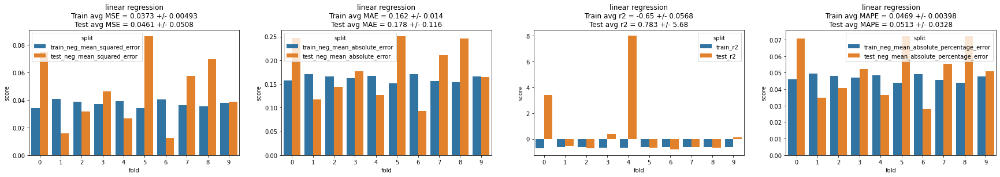

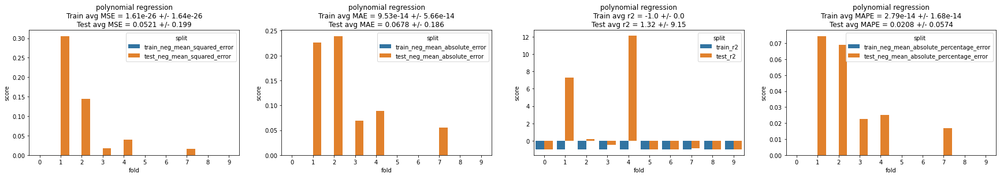

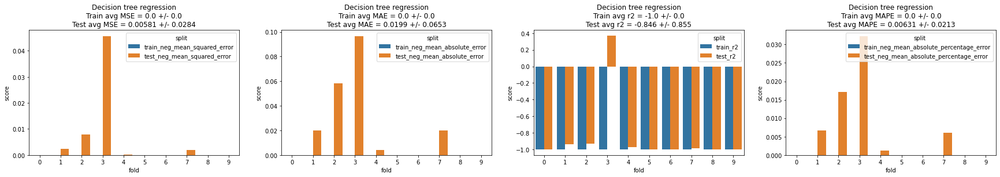

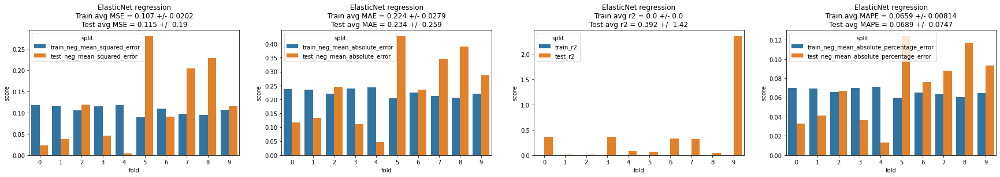

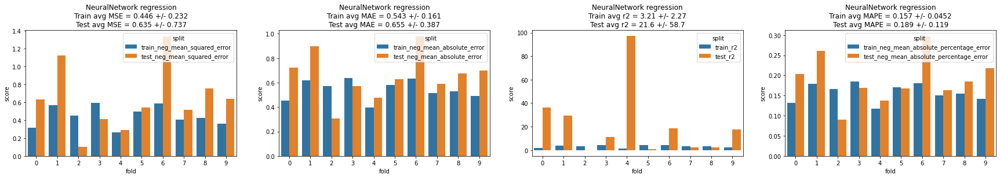

...

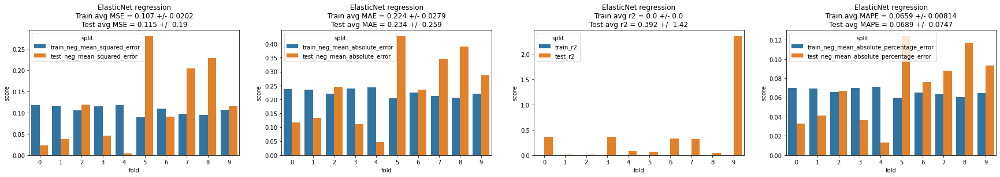

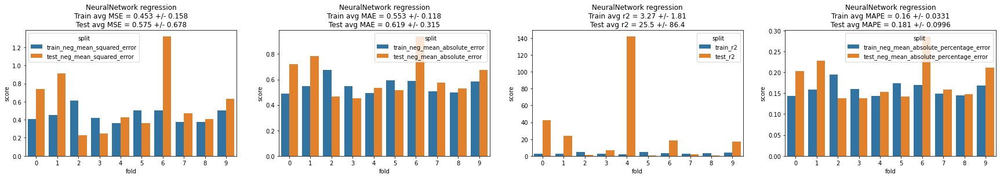

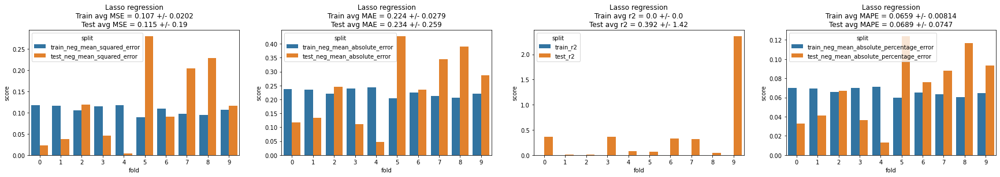

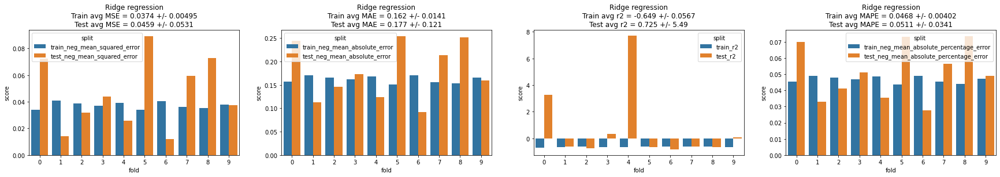

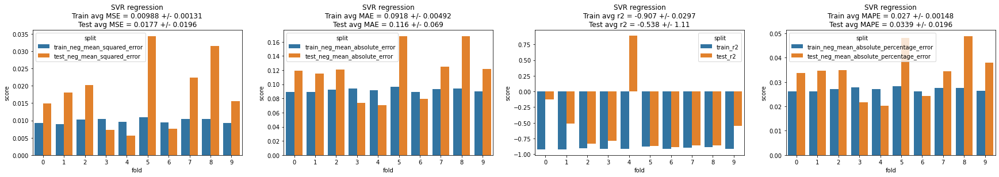

In [24]:
for _ in range(10):
    features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.10, random_state=42)
    linearRegression(features_train, features_test, target_train, target_test)
    polynomialRegression(features_train, features_test, target_train, target_test)
    decisiontree(features_train, features_test, target_train, target_test)
    elasticNet(features_train, features_test, target_train, target_test)
    neuralNetwork(features_train, features_test, target_train, target_test)
    lasso(features_train, features_test, target_train, target_test)
    ridge(features_train, features_test, target_train, target_test)
    svr(features_train, features_test, target_train, target_test)

In [25]:
all_train_scores.to_csv('k_fold_train.csv', index=False)
all_test_scores.to_csv('k_fold_test.csv', index=False)
all_avg_train_scores.to_csv('k_fold_avg_train.csv', index=False)
all_avg_test_scores.to_csv('k_fold_avg_test.csv', index=False)
all_avg_test_scores.to_csv('k_fold_avg_test.csv', index=False)

# Score table for left foot for 10-fold cross validation
## Train

In [26]:
all_avg_train_scores

,train_neg_mean_squared_error,train_neg_mean_absolute_error,train_r2,train_neg_mean_absolute_percentage_error,model
0,0.0373 +/- 0.00493,0.162 +/- 0.014,-0.65 +/- 0.0568,0.0469 +/- 0.00398,linear regression
0,1.61e-26 +/- 1.64e-26,9.53e-14 +/- 5.66e-14,-1.0 +/- 0.0,2.79e-14 +/- 1.68e-14,polynomial regression
0,0.0 +/- 0.0,0.0 +/- 0.0,-1.0 +/- 0.0,0.0 +/- 0.0,Decision tree regression
0,0.107 +/- 0.0202,0.224 +/- 0.0279,0.0 +/- 0.0,0.0659 +/- 0.00814,ElasticNet regression
0,0.446 +/- 0.232,0.543 +/- 0.161,3.21 +/- 2.27,0.157 +/- 0.0452,NeuralNetwork regression
...,...,...,...,...,...
0,0.107 +/- 0.0202,0.224 +/- 0.0279,0.0 +/- 0.0,0.0659 +/- 0.00814,ElasticNet regression
0,0.453 +/- 0.158,0.553 +/- 0.118,3.27 +/- 1.81,0.16 +/- 0.0331,NeuralNetwork regression
0,0.107 +/- 0.0202,0.224 +/- 0.0279,0.0 +/- 0.0,0.0659 +/- 0.00814,Lasso regression
0,0.0374 +/- 0.00495,0.162 +/- 0.0141,-0.649 +/- 0.0567,0.0468 +/- 0.00402,Ridge regression


## Test

In [27]:
all_avg_test_scores

,test_neg_mean_squared_error,test_neg_mean_absolute_error,test_r2,test_neg_mean_absolute_percentage_error,model
0,0.0461 +/- 0.0508,0.178 +/- 0.116,0.783 +/- 5.68,0.0513 +/- 0.0328,linear regression
0,0.0521 +/- 0.199,0.0678 +/- 0.186,1.32 +/- 9.15,0.0208 +/- 0.0574,polynomial regression
0,0.00581 +/- 0.0284,0.0199 +/- 0.0653,-0.846 +/- 0.855,0.00631 +/- 0.0213,Decision tree regression
0,0.115 +/- 0.19,0.234 +/- 0.259,0.392 +/- 1.42,0.0689 +/- 0.0747,ElasticNet regression
0,0.635 +/- 0.737,0.655 +/- 0.387,21.6 +/- 58.7,0.189 +/- 0.119,NeuralNetwork regression
...,...,...,...,...,...
0,0.115 +/- 0.19,0.234 +/- 0.259,0.392 +/- 1.42,0.0689 +/- 0.0747,ElasticNet regression
0,0.575 +/- 0.678,0.619 +/- 0.315,25.5 +/- 86.4,0.181 +/- 0.0996,NeuralNetwork regression
0,0.115 +/- 0.19,0.234 +/- 0.259,0.392 +/- 1.42,0.0689 +/- 0.0747,Lasso regression
0,0.0459 +/- 0.0531,0.177 +/- 0.121,0.725 +/- 5.49,0.0511 +/- 0.0341,Ridge regression


## Summary

By the result of those algorithm, the best algorithm is Ridge regression. For the reason, ridge regression algorithm gave a result, which have low mean squreed error and low mean absolute error. Moreover, its graph demonstrate us, that the result is not overfiting. 

# Train by using all data

Mean Absolute Error: 0.08385156996058574
Mean Square Error: 0.008575284241671146
r2 score: 0.8312690026780929
Mean Absolute Percentage Error: 0.02569698343569823


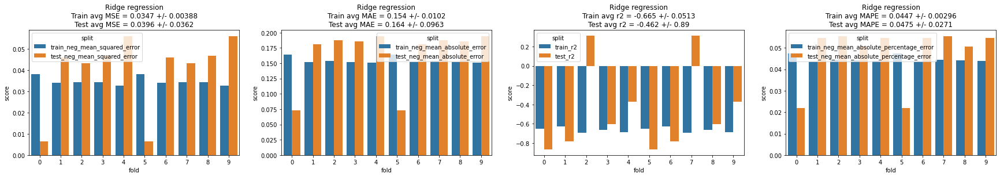

In [28]:

model = make_pipeline(
    preprocessing.StandardScaler(),
    Ridge())
scores = cross_validate(
    model, features, target, cv=10, 
    scoring=['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2', 'neg_mean_absolute_percentage_error'],
    return_train_score=True)
a = pd.DataFrame(scores)
a['fold'] = a.index
a = a.drop(columns=['fit_time', 'score_time'])
a['test_neg_mean_squared_error'] = a['test_neg_mean_squared_error'] * -1
a['train_neg_mean_squared_error'] = a['train_neg_mean_squared_error'] * -1
a['test_neg_mean_absolute_error'] = a['test_neg_mean_absolute_error'] * -1
a['train_neg_mean_absolute_error'] = a['train_neg_mean_absolute_error'] * -1
a['test_r2'] = a['test_r2'] * -1
a['train_r2'] = a['train_r2'] * -1
a['test_neg_mean_absolute_percentage_error'] = a['test_neg_mean_absolute_percentage_error'] * -1
a['train_neg_mean_absolute_percentage_error'] = a['train_neg_mean_absolute_percentage_error'] * -1
b = pd.melt(a, id_vars='fold', var_name='split', value_name='score')
fig, axes = plt.subplots(ncols=4, figsize=(30, 4))
sns.barplot(
    x='fold', y='score', hue='split',
    hue_order=['train_neg_mean_squared_error', 'test_neg_mean_squared_error'], data=b, ax=axes[0])
axes[0].set_title((
    f'Ridge regression\n'
    f'Train avg MSE = {a["train_neg_mean_squared_error"].mean():.3} +/- {a["train_neg_mean_squared_error"].std() * 2:.3}\n'
    f'Test avg MSE = {a["test_neg_mean_squared_error"].mean():.3} +/- {a["test_neg_mean_squared_error"].std() * 2:.3}'
    ))

sns.barplot(
    x='fold', y='score', hue='split',
    hue_order=['train_neg_mean_absolute_error', 'test_neg_mean_absolute_error'], data=b, ax=axes[1])
axes[1].set_title((
    f'Ridge regression\n'
    f'Train avg MAE = {a["train_neg_mean_absolute_error"].mean():.3} +/- {a["train_neg_mean_absolute_error"].std() * 2:.3}\n'
    f'Test avg MAE = {a["test_neg_mean_absolute_error"].mean():.3} +/- {a["test_neg_mean_absolute_error"].std() * 2:.3}'
    ))

sns.barplot(
    x='fold', y='score', hue='split',
    hue_order=['train_r2', 'test_r2'], data=b, ax=axes[2])
axes[2].set_title((
    f'Ridge regression\n'
    f'Train avg r2 = {a["train_r2"].mean():.3} +/- {a["train_r2"].std() * 2:.3}\n'
    f'Test avg r2 = {a["test_r2"].mean():.3} +/- {a["test_r2"].std() * 2:.3}'
    ))
sns.barplot(
    x='fold', y='score', hue='split',
    hue_order=['train_neg_mean_absolute_percentage_error', 'test_neg_mean_absolute_percentage_error'], data=b, ax=axes[3])
axes[3].set_title((
    f'Ridge regression\n'
    f'Train avg MAPE = {a["train_neg_mean_absolute_percentage_error"].mean():.3} +/- {a["train_neg_mean_absolute_percentage_error"].std() * 2:.3}\n'
    f'Test avg MAPE = {a["test_neg_mean_absolute_percentage_error"].mean():.3} +/- {a["test_neg_mean_absolute_percentage_error"].std() * 2:.3}'
    ))
regression = model.fit(features_train, target_train)
predict_result = regression.predict(features_test)
regression = model.fit(features, target)
predict_result = regression.predict(features_test)
print('Mean Absolute Error:', mean_absolute_error(target_test['arch_height'], predict_result))
print('Mean Square Error:', mean_squared_error(target_test['arch_height'], predict_result))
print('r2 score:', r2_score(target_test['arch_height'], predict_result))
print('Mean Absolute Percentage Error:', mean_absolute_percentage_error(target_test['arch_height'], predict_result))

# Hyperparameter tuning

In [29]:
from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import HalvingGridSearchCV

params_ridge = {'alpha': [1,0.1,0.01,0.001,0.0001,0] , 'normalize': [True, False], 'fit_intercept': [True, False], 'solver': ['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']}
ridge_model = Ridge()
tuned_model = HalvingGridSearchCV(ridge_model, params_ridge, cv = 10, scoring = 'neg_mean_squared_error', return_train_score = True).fit(features, target)
best_parameters = tuned_model.best_params_
best_score = tuned_model.best_score_
print('Best parameters:',best_parameters)

Best parameters: {'alpha': 0.01, 'fit_intercept': True, 'normalize': True, 'solver': 'saga'}


In [30]:
best_score

-0.03968166688714185

# Test tuned model

In [31]:
model = Ridge(**best_parameters).fit(features, target)
predict_result = model.predict(features_test)
print('Mean Absolute Error:', mean_absolute_error(target_test['arch_height'], predict_result))
print('Mean Square Error:', mean_squared_error(target_test['arch_height'], predict_result))
print('r2 score:', r2_score(target_test['arch_height'], predict_result))
print('Mean Absolute Percentage Error:', mean_absolute_percentage_error(target_test['arch_height'], predict_result))

Mean Absolute Error: 0.08435600602717197
Mean Square Error: 0.008668742499613018
r2 score: 0.8294300776202073
Mean Absolute Percentage Error: 0.025865252315758955


# Save model for k-fold cross validation

In [35]:
from joblib import dump, load
dump(model, model_file_name) 

['model.joblib']

In [36]:
clf = load(model_file_name) 

TypeError: file must have 'read' and 'readline' attributes

In [122]:
try_predict_result = clf.predict(features_test)
print('Mean Absolute Error:', mean_absolute_error(target_test['arch_height'], predict_result))
print('Mean Square Error:', mean_squared_error(target_test['arch_height'], predict_result))
print('r2 score:', r2_score(target_test['arch_height'], predict_result))
print('Mean Absolute Percentage Error:', mean_absolute_percentage_error(target_test['arch_height'], predict_result))

Mean Absolute Error: 0.08434422896271114
Mean Square Error: 0.008668056016121218
r2 score: 0.8294435851659576
Mean Absolute Percentage Error: 0.02586087338609766


# Leave one out

# Linear regression

In [123]:
# all_train_scores = pd.DataFrame(columns=['train_neg_mean_squared_error', 'train_neg_mean_absolute_error',  'train_r2', 'train_neg_mean_absolute_percentage_error', 'model'])
# all_test_scores = pd.DataFrame(columns=['test_neg_mean_squared_error', 'test_neg_mean_absolute_error',  'test_r2', 'test_neg_mean_absolute_percentage_error', 'model'])
# all_avg_train_scores = pd.DataFrame(columns=['train_neg_mean_squared_error', 'train_neg_mean_absolute_error',  'train_r2', 'train_neg_mean_absolute_percentage_error', 'model'])
# all_avg_test_scores = pd.DataFrame(columns=['test_neg_mean_squared_error', 'test_neg_mean_absolute_error',  'test_r2', 'test_neg_mean_absolute_percentage_error', 'model'])
# sample_test_score = pd.DataFrame(columns=['MAE', 'MSE',  'R2', 'MAPEE', 'model'])

In [124]:
# for _ in range(10):
#     features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.10, random_state=42)
#     linearRegression(features_train, features_test, target_train, target_test, True)
#     polynomialRegression(features_train, features_test, target_train, target_test, True)
#     decisiontree(features_train, features_test, target_train, target_test, True)
#     elasticNet(features_train, features_test, target_train, target_test, True)
#     neuralNetwork(features_train, features_test, target_train, target_test, True)
#     lasso(features_train, features_test, target_train, target_test, True)
#     ridge(features_train, features_test, target_train, target_test, True)
#     svr(features_train, features_test, target_train, target_test, True)

In [125]:
# all_train_scores.to_csv('loo_train.csv', index=False)
# all_test_scores.to_csv('loo_test.csv', index=False)
# all_avg_train_scores.to_csv('loo_avg_test.csv', index=False)
# all_avg_test_scores.to_csv('loo_avg_test.csv', index=False)

In [126]:
# all_avg_train_scores

In [127]:
# all_avg_test_scores

# Summary
After try to use LOO technique with the cross validation technique, we can see that Ridge algorithm also a best practice for predict foot arch height.

# Train all data

/Users/matchattatoyaem/work/senior/senior-machine-learning/venv/lib/python3.9/site-packages/sklearn/metrics/_regression.py:682: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/matchattatoyaem/work/senior/senior-machine-learning/venv/lib/python3.9/site-packages/sklearn/metrics/_regression.py:682: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/matchattatoyaem/work/senior/senior-machine-learning/venv/lib/python3.9/site-packages/sklearn/metrics/_regression.py:682: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/matchattatoyaem/work/senior/senior-machine-learning/venv/lib/python3.9/site-packages/sklearn/metrics/_regression.py:682: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, Unde

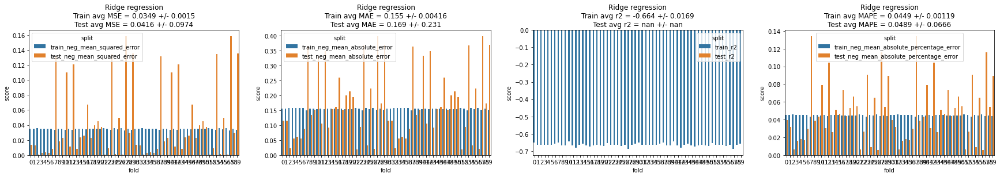

In [128]:

model = make_pipeline(
    preprocessing.StandardScaler(),
    Ridge())
scores = cross_validate(
    model, features, target, cv=LeaveOneOut(), 
    scoring=['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2', 'neg_mean_absolute_percentage_error'],
    return_train_score=True)
a = pd.DataFrame(scores)
a['fold'] = a.index
a = a.drop(columns=['fit_time', 'score_time'])
a['test_neg_mean_squared_error'] = a['test_neg_mean_squared_error'] * -1
a['train_neg_mean_squared_error'] = a['train_neg_mean_squared_error'] * -1
a['test_neg_mean_absolute_error'] = a['test_neg_mean_absolute_error'] * -1
a['train_neg_mean_absolute_error'] = a['train_neg_mean_absolute_error'] * -1
a['test_r2'] = a['test_r2'] * -1
a['train_r2'] = a['train_r2'] * -1
a['test_neg_mean_absolute_percentage_error'] = a['test_neg_mean_absolute_percentage_error'] * -1
a['train_neg_mean_absolute_percentage_error'] = a['train_neg_mean_absolute_percentage_error'] * -1
b = pd.melt(a, id_vars='fold', var_name='split', value_name='score')
fig, axes = plt.subplots(ncols=4, figsize=(30, 4))
sns.barplot(
    x='fold', y='score', hue='split',
    hue_order=['train_neg_mean_squared_error', 'test_neg_mean_squared_error'], data=b, ax=axes[0])
axes[0].set_title((
    f'Ridge regression\n'
    f'Train avg MSE = {a["train_neg_mean_squared_error"].mean():.3} +/- {a["train_neg_mean_squared_error"].std() * 2:.3}\n'
    f'Test avg MSE = {a["test_neg_mean_squared_error"].mean():.3} +/- {a["test_neg_mean_squared_error"].std() * 2:.3}'
    ))

sns.barplot(
    x='fold', y='score', hue='split',
    hue_order=['train_neg_mean_absolute_error', 'test_neg_mean_absolute_error'], data=b, ax=axes[1])
axes[1].set_title((
    f'Ridge regression\n'
    f'Train avg MAE = {a["train_neg_mean_absolute_error"].mean():.3} +/- {a["train_neg_mean_absolute_error"].std() * 2:.3}\n'
    f'Test avg MAE = {a["test_neg_mean_absolute_error"].mean():.3} +/- {a["test_neg_mean_absolute_error"].std() * 2:.3}'
    ))

sns.barplot(
    x='fold', y='score', hue='split',
    hue_order=['train_r2', 'test_r2'], data=b, ax=axes[2])
axes[2].set_title((
    f'Ridge regression\n'
    f'Train avg r2 = {a["train_r2"].mean():.3} +/- {a["train_r2"].std() * 2:.3}\n'
    f'Test avg r2 = {a["test_r2"].mean():.3} +/- {a["test_r2"].std() * 2:.3}'
    ))
sns.barplot(
    x='fold', y='score', hue='split',
    hue_order=['train_neg_mean_absolute_percentage_error', 'test_neg_mean_absolute_percentage_error'], data=b, ax=axes[3])
axes[3].set_title((
    f'Ridge regression\n'
    f'Train avg MAPE = {a["train_neg_mean_absolute_percentage_error"].mean():.3} +/- {a["train_neg_mean_absolute_percentage_error"].std() * 2:.3}\n'
    f'Test avg MAPE = {a["test_neg_mean_absolute_percentage_error"].mean():.3} +/- {a["test_neg_mean_absolute_percentage_error"].std() * 2:.3}'
    ))
regression = model.fit(features_train, target_train)
predict_result = regression.predict(features_test)
regression = model.fit(features, target)
predict_result = regression.predict(features_test)
print('Mean Absolute Error:', mean_absolute_error(target_test['arch_height'], predict_result))
print('Mean Square Error:', mean_squared_error(target_test['arch_height'], predict_result))
print('r2 score:', r2_score(target_test['arch_height'], predict_result))
print('Mean Absolute Percentage Error:', mean_absolute_percentage_error(target_test['arch_height'], predict_result))

In [129]:
clf = load(model_file_name) 
try_predict_result = clf.predict(features)
try_predict_result

array([[3.05381571],
       [3.72114257],
       [3.56204219],
       [3.57096247],
       [3.44468473],
       [3.39266387],
       [2.94678536],
       [3.03285999],
       [3.34896327],
       [3.33733594],
       [3.91513251],
       [3.54232363],
       [3.65769863],
       [3.43759502],
       [3.14910197],
       [3.28548645],
       [3.78953693],
       [3.28366301],
       [3.57898587],
       [3.42323929],
       [3.35113185],
       [3.01456041],
       [3.4872798 ],
       [3.72199689],
       [3.47054738],
       [3.63251537],
       [3.39916591],
       [3.81005422],
       [2.98871239],
       [3.80001637],
       [3.05381571],
       [3.72114257],
       [3.56204219],
       [3.57096247],
       [3.44468473],
       [3.39266387],
       [2.94678536],
       [3.03285999],
       [3.34896327],
       [3.33733594],
       [3.91513251],
       [3.54232363],
       [3.65769863],
       [3.43759502],
       [3.14910197],
       [3.28548645],
       [3.78953693],
       [3.283

In [130]:
encoded_data['predict'] = try_predict_result
encoded_data[['predict', 'arch_height']]

,predict,arch_height
0,3.053816,2.95
1,3.721143,3.61
2,3.562042,3.54
3,3.570962,3.52
4,3.444685,3.39
5,3.392664,3.34
6,2.946785,3.03
7,3.032860,2.70
8,3.348963,3.48
9,3.337336,3.47


In [131]:
encoded_data['diff'] = encoded_data['predict'] - encoded_data['arch_height']

In [132]:
encoded_data[['predict', 'arch_height', 'diff']]

,predict,arch_height,diff
0,3.053816,2.95,0.103816
1,3.721143,3.61,0.111143
2,3.562042,3.54,0.022042
3,3.570962,3.52,0.050962
4,3.444685,3.39,0.054685
5,3.392664,3.34,0.052664
6,2.946785,3.03,-0.083215
7,3.032860,2.70,0.332860
8,3.348963,3.48,-0.131037
9,3.337336,3.47,-0.132664
